Name: Aaron Szabo<br>
Last Editted: 12/15/19<br>
Class: CMSC320<br>
# Analyzing the Continuing Impact of Redlining on Baltimore's Housing Market

In [343]:
import pandas as pd
import geopandas as gpd
import folium
import shapely
import numpy as np
import statsmodels.api as sm
import statsmodels.formula.api as smf
import numpy as np
import math
import matplotlib.pyplot as plt

In [344]:
redline_data = gpd.read_file("MDBaltimore1937.geojson")
data = gpd.read_file("mygeodata/tl_2010_24510_bg10.geojson")
housing_data = pd.read_csv("2011_Housing_Market_Typology.csv")

In [345]:
def redlining_colormap(holc_grade):
    if holc_grade == 'A':
        return "#00ff00"
    elif holc_grade == 'B':
        return "#0000ff"
    elif holc_grade == 'C':
        return "#ffff00"
    elif holc_grade == 'D':
        return "#ff0000"
    else:
        return "#ffffff"

redline_data['color'] = redline_data['holc_grade'].apply(redlining_colormap)

In [348]:
perc_green = []
perc_blue = []
perc_yellow = []
perc_red = []
for index1,c_row in data.iterrows():
    c_district = c_row['geometry']
    c_area = c_district.area
    is_green = False
    is_blue = False
    is_yellow = False
    is_red = False
    for index2,r_row in redline_data.iterrows():
        r_area = r_row['geometry']
        if c_district.intersects(r_area):
            overlap_area = c_district.intersection(r_area).area
            if (overlap_area > 0):
                if r_row['holc_grade'] == 'A':
                    if is_green:
                        perc_green[index1] += overlap_area/c_area
                    else:
                        is_green = True
                        perc_green.append(overlap_area/c_area)
                elif r_row['holc_grade'] == 'B':
                    if is_blue:
                        perc_blue[index1] += overlap_area/c_area
                    else:
                        is_blue = True
                        perc_blue.append(overlap_area/c_area)
                elif r_row['holc_grade'] == 'C':
                    if is_yellow:
                        perc_yellow[index1] += overlap_area/c_area
                    else:
                        is_yellow = True
                        perc_yellow.append(overlap_area/c_area)
                elif r_row['holc_grade'] == 'D':
                    if is_red:
                        perc_red[index1] += overlap_area/c_area
                    else:
                        is_red = True
                        perc_red.append(overlap_area/c_area)
    if not is_green:
        perc_green.append(0.0)
    if not is_blue:
        perc_blue.append(0.0)
    if not is_yellow:
        perc_yellow.append(0.0)
    if not is_red:
        perc_red.append(0.0)
data['perc_green'] = perc_green
data['perc_blue'] = perc_blue
data['perc_yellow'] = perc_yellow
data['perc_red'] = perc_red

In [350]:
housing_data['blockGroup'] = housing_data['blockGroup'].apply(lambda x: str(x) if (len(str(x)) == 7) else ('0'+str(x)))

In [351]:
missing = []
for index,d_row in data.iterrows():
    found = False
    for index2,h_row in housing_data.iterrows():
        if ('24510' + h_row['blockGroup']) == d_row['GEOID10']:
            found = True
            break

            
    if not found:
        missing.append(d_row['geometry'])

30 missing data points out of 653 and no double counts

In [399]:
temp = com_data.copy()
census_geo = gpd.GeoDataFrame(temp, geometry=temp['geometry'])
census_geo.crs = {'init': 'epsg:4269'}

missing_df = pd.DataFrame(columns=['geometry'], data=missing)
missing_gdf = gpd.GeoDataFrame(missing_df, geometry=missing_df['geometry'])
missing_gdf.crs = {'init': 'epsg:4269'}

In [400]:
map_c = folium.Map(location=[39.29, -76.61], zoom_start=11)
folium.GeoJson(redline_data, name='Redlining Map', style_function=lambda feature: {
    'fillColor': feature['properties']['color'],
    'color': feature['properties']['color'],
    'weight': 1,
    'fillOpacity': 0.5,
}).add_to(map_c)
folium.GeoJson(census_geo, name='Census Districts', style_function=lambda feature: {
    'fillColor': "#333333",
    'color': "#000000",
    'weight': 0.5,
    'fillOpacity': 0.1
}).add_to(map_c)
folium.GeoJson(missing_gdf, name='Missing Census Districts', style_function=lambda feature: {
    'fillColor': "#00ffff",
    'color': "#000000",
    'weight': 0.5,
    'fillOpacity': 0.5
}).add_to(map_c)
folium.LayerControl().add_to(map_c)
map_c

In [352]:
com_data = pd.DataFrame(columns=['GEOID10', 'geometry', 'area', 'perc_green', 'perc_blue', 'perc_yellow', 'perc_red', 'ratio_vacant', 'ratio_foreclosed', 'ratio_sales', 'median_sale_price', 'log_ratio_vacant', 'log_ratio_foreclosed', 'log_ratio_sales', 'log_median_sale_price'])
for index,d_row in data.iterrows():
    area = d_row['ALAND10']/2590000.0
    new_row = {'GEOID10': d_row['GEOID10'], 
              'geometry': d_row['geometry'],
              'area': area,
              'perc_green': d_row['perc_green'],
              'perc_blue': d_row['perc_blue'],
              'perc_yellow': d_row['perc_yellow'],
              'perc_red': d_row['perc_red']}
    for index2,h_row in housing_data.iterrows():
        if ('24510' + h_row['blockGroup']) == d_row['GEOID10']:
            new_row['ratio_vacant'] = h_row['vacantLots']
            if new_row['ratio_vacant'] == 0:
                new_row['log_ratio_vacant'] = 0
            else:
                new_row['log_ratio_vacant'] = math.log(new_row['ratio_vacant'])
            if h_row['foreclosureFilings'] > 100:
                new_row['ratio_foreclosed'] = 100
            else:
                new_row['ratio_foreclosed'] = h_row['foreclosureFilings']
            if new_row['ratio_foreclosed'] == 0:
                new_row['log_ratio_foreclosed'] = 0
            else:
                new_row['log_ratio_foreclosed'] = math.log(new_row['ratio_foreclosed'])
            if h_row['unitsPerSquareMile'] == 0:
                new_row['ratio_sales'] = 0
            else:
                new_row['ratio_sales'] = h_row['sales20092010']/h_row['unitsPerSquareMile']*area
            if new_row['ratio_sales'] == 0:
                new_row['log_ratio_sales'] = 0
            else:
                new_row['log_ratio_sales'] = math.log(new_row['ratio_sales'])
            new_row['median_sale_price'] = h_row['medianSalesPrice20092010']
            if new_row['median_sale_price'] == 0:
                new_row['log_median_sale_price'] = 0
            else:
                new_row['log_median_sale_price'] = math.log(new_row['median_sale_price'])
            break
    com_data = com_data.append(pd.Series(new_row), ignore_index=True)
com_data
com_data = com_data.dropna()

In [401]:
map_d = folium.Map(location=[39.29, -76.61], zoom_start=11)
folium.Choropleth(
    geo_data=census_geo[['GEOID10', 'geometry']],
    name='Ratio of Vacancies',
    data=census_geo,
    columns=['GEOID10', 'ratio_vacant'],
    key_on='feature.properties.GEOID10',
    fill_color='Blues',
    fill_opacity=0.5,
    line_opacity=0.7,
    legend_name='Ratio of Vacancies',
    show=False).add_to(map_d)
folium.Choropleth(
    geo_data=census_geo[['GEOID10', 'geometry']],
    name='Ratio of Foreclosures',
    data=census_geo,
    columns=['GEOID10', 'ratio_foreclosed'],
    key_on='feature.properties.GEOID10',
    fill_color='OrRd',
    fill_opacity=0.7,
    line_opacity=0.7,
    legend_name='Ratio of Foreclosures',
    show=False).add_to(map_d)
folium.Choropleth(
    geo_data=census_geo[['GEOID10', 'geometry']],
    name='Ratio of Sales',
    data=census_geo,
    columns=['GEOID10', 'ratio_sales'],
    key_on='feature.properties.GEOID10',
    fill_color='Purples',
    fill_opacity=0.7,
    line_opacity=0.7,
    legend_name='Ratio of Sales',
    show=False).add_to(map_d)
folium.Choropleth(
    geo_data=census_geo[['GEOID10', 'geometry']],
    name='Median Sales Price',
    data=census_geo,
    columns=['GEOID10', 'median_sale_price'],
    key_on='feature.properties.GEOID10',
    fill_color='BuGn',
    fill_opacity=0.5,
    line_opacity=0.7,
    legend_name='Median Sales Price',
    show=False).add_to(map_d)
folium.GeoJson(redline_data, name='Redlining Map', style_function=lambda feature: {
    'fillColor': feature['properties']['color'],
    'color': feature['properties']['color'],
    'weight': 0.7,
    'fillOpacity': 0.3,
}).add_to(map_d)
folium.LayerControl().add_to(map_d)
map_d

(array([450.,  99.,  38.,  15.,   7.,   6.,   3.,   1.,   0.,   4.]),
 array([ 0. ,  9.2, 18.4, 27.6, 36.8, 46. , 55.2, 64.4, 73.6, 82.8, 92. ]),
 <a list of 10 Patch objects>)

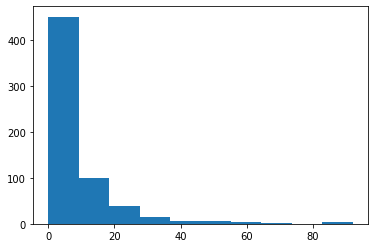

In [402]:
plt.hist(com_data['ratio_vacant'])

In [353]:
X = sm.add_constant(com_data[['perc_green', 'perc_blue', 'perc_yellow', 'perc_red']])
smmodel_v = sm.OLS(com_data['ratio_vacant'], X)
smfit_v = smmodel_v.fit()
print(smfit_v.summary())

                            OLS Regression Results                            
Dep. Variable:           ratio_vacant   R-squared:                       0.095
Model:                            OLS   Adj. R-squared:                  0.089
Method:                 Least Squares   F-statistic:                     16.23
Date:                Sun, 15 Dec 2019   Prob (F-statistic):           1.19e-12
Time:                        14:32:59   Log-Likelihood:                -2392.4
No. Observations:                 623   AIC:                             4795.
Df Residuals:                     618   BIC:                             4817.
Df Model:                           4                                         
Covariance Type:            nonrobust                                         
                  coef    std err          t      P>|t|      [0.025      0.975]
-------------------------------------------------------------------------------
const           8.5384      1.026      8.319      

C:\Users\Szabo\Anaconda3\lib\site-packages\numpy\core\fromnumeric.py:2389: FutureWarning: Method .ptp is deprecated and will be removed in a future version. Use numpy.ptp instead.
  return ptp(axis=axis, out=out, **kwargs)


(array([577.,  41.,   3.,   0.,   0.,   1.,   0.,   0.,   0.,   1.]),
 array([  0.,  10.,  20.,  30.,  40.,  50.,  60.,  70.,  80.,  90., 100.]),
 <a list of 10 Patch objects>)

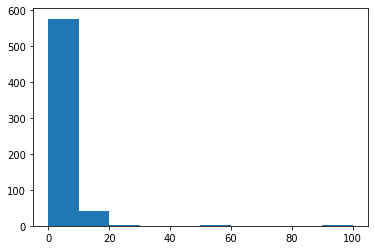

In [403]:
plt.hist(com_data['ratio_foreclosed'])

In [354]:
smmodel_f = sm.OLS(com_data['ratio_foreclosed'], X)
smfit_f = smmodel_f.fit()
print(smfit_f.summary())

                            OLS Regression Results                            
Dep. Variable:       ratio_foreclosed   R-squared:                       0.013
Model:                            OLS   Adj. R-squared:                  0.006
Method:                 Least Squares   F-statistic:                     1.957
Date:                Sun, 15 Dec 2019   Prob (F-statistic):             0.0996
Time:                        14:33:01   Log-Likelihood:                -1903.6
No. Observations:                 623   AIC:                             3817.
Df Residuals:                     618   BIC:                             3839.
Df Model:                           4                                         
Covariance Type:            nonrobust                                         
                  coef    std err          t      P>|t|      [0.025      0.975]
-------------------------------------------------------------------------------
const           5.0291      0.468     10.739      

(array([621.,   1.,   0.,   0.,   0.,   0.,   0.,   0.,   0.,   1.]),
 array([0.        , 0.04814597, 0.09629194, 0.14443791, 0.19258389,
        0.24072986, 0.28887583, 0.3370218 , 0.38516777, 0.43331374,
        0.48145971]),
 <a list of 10 Patch objects>)

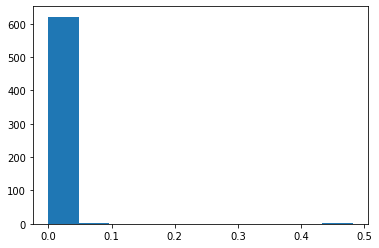

In [404]:
plt.hist(com_data['ratio_sales'])

In [355]:
smmodel_s = sm.OLS(com_data['ratio_sales'], X)
smfit_s = smmodel_s.fit()
print(smfit_s.summary())

                            OLS Regression Results                            
Dep. Variable:            ratio_sales   R-squared:                       0.022
Model:                            OLS   Adj. R-squared:                  0.016
Method:                 Least Squares   F-statistic:                     3.534
Date:                Sun, 15 Dec 2019   Prob (F-statistic):            0.00730
Time:                        14:33:05   Log-Likelihood:                 1565.8
No. Observations:                 623   AIC:                            -3122.
Df Residuals:                     618   BIC:                            -3099.
Df Model:                           4                                         
Covariance Type:            nonrobust                                         
                  coef    std err          t      P>|t|      [0.025      0.975]
-------------------------------------------------------------------------------
const           0.0081      0.002      4.508      

(array([313., 150.,  82.,  42.,  11.,  11.,   7.,   2.,   2.,   3.]),
 array([     0.,  67000., 134000., 201000., 268000., 335000., 402000.,
        469000., 536000., 603000., 670000.]),
 <a list of 10 Patch objects>)

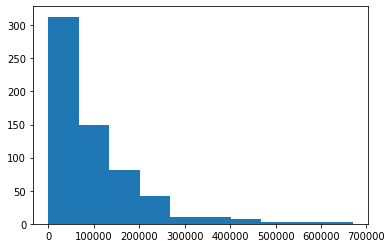

In [405]:
plt.hist(com_data['median_sale_price'])

In [356]:
smmodel_p = sm.OLS(com_data['median_sale_price'], X)
smfit_p = smmodel_p.fit()
print(smfit_p.summary())

                            OLS Regression Results                            
Dep. Variable:      median_sale_price   R-squared:                       0.152
Model:                            OLS   Adj. R-squared:                  0.147
Method:                 Least Squares   F-statistic:                     27.78
Date:                Sun, 15 Dec 2019   Prob (F-statistic):           3.12e-21
Time:                        14:33:08   Log-Likelihood:                -8006.8
No. Observations:                 623   AIC:                         1.602e+04
Df Residuals:                     618   BIC:                         1.605e+04
Df Model:                           4                                         
Covariance Type:            nonrobust                                         
                  coef    std err          t      P>|t|      [0.025      0.975]
-------------------------------------------------------------------------------
const        1.107e+05   8415.430     13.154      

In [371]:
map_dl = folium.Map(location=[39.29, -76.61], zoom_start=11)
folium.Choropleth(
    geo_data=census_geo[['GEOID10', 'geometry']],
    name='Log of Ratio of Vacancies',
    data=census_geo,
    columns=['GEOID10', 'log_ratio_vacant'],
    key_on='feature.properties.GEOID10',
    fill_color='Blues',
    fill_opacity=0.5,
    line_opacity=0.7,
    legend_name='Log of Ratio of Vacancies',
    show=False).add_to(map_dl)
folium.Choropleth(
    geo_data=census_geo[['GEOID10', 'geometry']],
    name='Log of Ratio of Foreclosures',
    data=census_geo,
    columns=['GEOID10', 'log_ratio_foreclosed'],
    key_on='feature.properties.GEOID10',
    fill_color='OrRd',
    fill_opacity=0.7,
    line_opacity=0.7,
    legend_name='Log og Ratio of Foreclosures',
    show=False).add_to(map_dl)
folium.Choropleth(
    geo_data=census_geo[['GEOID10', 'geometry']],
    name='Log of Ratio of Sales',
    data=census_geo,
    columns=['GEOID10', 'log_ratio_sales'],
    key_on='feature.properties.GEOID10',
    fill_color='Purples',
    fill_opacity=0.7,
    line_opacity=0.7,
    legend_name='Log of Ratio of Sales',
    show=False).add_to(map_dl)
folium.Choropleth(
    geo_data=census_geo[['GEOID10', 'geometry']],
    name='Log of Median Sales Price',
    data=census_geo,
    columns=['GEOID10', 'log_median_sale_price'],
    key_on='feature.properties.GEOID10',
    fill_color='BuGn',
    fill_opacity=0.5,
    line_opacity=0.7,
    legend_name='Log of Median Sales Price',
    show=False).add_to(map_dl)
folium.GeoJson(redline_data, name='Redlining Map', style_function=lambda feature: {
    'fillColor': feature['properties']['color'],
    'color': feature['properties']['color'],
    'weight': 0.7,
    'fillOpacity': 0.3,
}).add_to(map_dl)
folium.LayerControl().add_to(map_dl)
map_dl

(array([138.,  64.,  43., 140.,  65.,  76.,  52.,  27.,  12.,   6.]),
 array([0.        , 0.45217886, 0.90435772, 1.35653657, 1.80871543,
        2.26089429, 2.71307315, 3.165252  , 3.61743086, 4.06960972,
        4.52178858]),
 <a list of 10 Patch objects>)

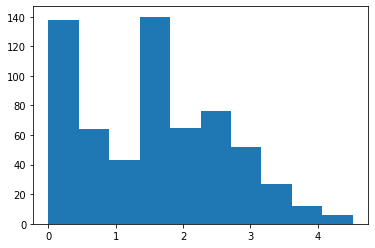

In [406]:
plt.hist(com_data['log_ratio_vacant'])

In [411]:
smmodel_vl = sm.OLS(com_data['log_ratio_vacant'], X)
smfit_vl = smmodel_vl.fit()
print(smfit_vl.summary())

                            OLS Regression Results                            
Dep. Variable:       log_ratio_vacant   R-squared:                       0.065
Model:                            OLS   Adj. R-squared:                  0.059
Method:                 Least Squares   F-statistic:                     10.73
Date:                Sun, 15 Dec 2019   Prob (F-statistic):           2.07e-08
Time:                        15:09:45   Log-Likelihood:                -933.32
No. Observations:                 623   AIC:                             1877.
Df Residuals:                     618   BIC:                             1899.
Df Model:                           4                                         
Covariance Type:            nonrobust                                         
                  coef    std err          t      P>|t|      [0.025      0.975]
-------------------------------------------------------------------------------
const           1.4424      0.099     14.620      

(array([ 39.,  50.,  84., 275., 129.,  38.,   6.,   0.,   1.,   1.]),
 array([0.        , 0.46051702, 0.92103404, 1.38155106, 1.84206807,
        2.30258509, 2.76310211, 3.22361913, 3.68413615, 4.14465317,
        4.60517019]),
 <a list of 10 Patch objects>)

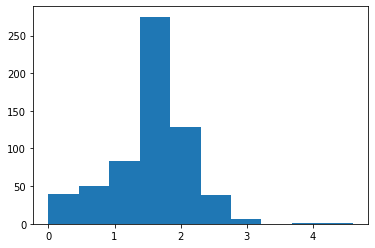

In [407]:
plt.hist(com_data['log_ratio_foreclosed'])

In [412]:
smmodel_fl = sm.OLS(com_data['log_ratio_foreclosed'], X)
smfit_fl = smmodel_fl.fit()
print(smfit_fl.summary())

                             OLS Regression Results                             
Dep. Variable:     log_ratio_foreclosed   R-squared:                       0.069
Model:                              OLS   Adj. R-squared:                  0.063
Method:                   Least Squares   F-statistic:                     11.38
Date:                  Sun, 15 Dec 2019   Prob (F-statistic):           6.40e-09
Time:                          15:09:52   Log-Likelihood:                -571.03
No. Observations:                   623   AIC:                             1152.
Df Residuals:                       618   BIC:                             1174.
Df Model:                             4                                         
Covariance Type:              nonrobust                                         
                  coef    std err          t      P>|t|      [0.025      0.975]
-------------------------------------------------------------------------------
const           1.3237      0.

(array([  4.,  12.,  74., 219., 170.,  85.,  28.,   7.,   1.,  23.]),
 array([-13.83069943, -12.44762948, -11.06455954,  -9.6814896 ,
         -8.29841966,  -6.91534971,  -5.53227977,  -4.14920983,
         -2.76613989,  -1.38306994,   0.        ]),
 <a list of 10 Patch objects>)

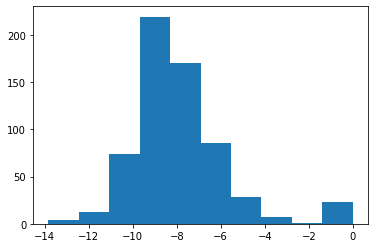

In [408]:
plt.hist(com_data['log_ratio_sales'])

In [413]:
smmodel_sl = sm.OLS(com_data['log_ratio_sales'], X)
smfit_sl = smmodel_sl.fit()
print(smfit_sl.summary())

                            OLS Regression Results                            
Dep. Variable:        log_ratio_sales   R-squared:                       0.211
Model:                            OLS   Adj. R-squared:                  0.206
Method:                 Least Squares   F-statistic:                     41.38
Date:                Sun, 15 Dec 2019   Prob (F-statistic):           9.48e-31
Time:                        15:09:59   Log-Likelihood:                -1298.3
No. Observations:                 623   AIC:                             2607.
Df Residuals:                     618   BIC:                             2629.
Df Model:                           4                                         
Covariance Type:            nonrobust                                         
                  coef    std err          t      P>|t|      [0.025      0.975]
-------------------------------------------------------------------------------
const          -6.0334      0.177    -34.037      

(array([ 22.,   0.,   0.,   0.,   0.,   0.,  15., 194., 299.,  93.]),
 array([ 0.        ,  1.3415033 ,  2.6830066 ,  4.0245099 ,  5.3660132 ,
         6.7075165 ,  8.04901979,  9.39052309, 10.73202639, 12.07352969,
        13.41503299]),
 <a list of 10 Patch objects>)

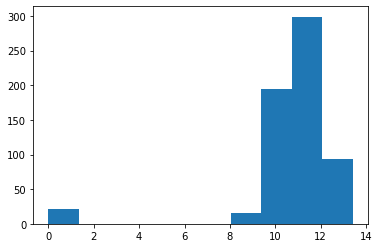

In [409]:
plt.hist(com_data['log_median_sale_price'])

In [414]:
smmodel_pl = sm.OLS(com_data['log_median_sale_price'], X)
smfit_pl = smmodel_pl.fit()
print(smfit_pl.summary())

                              OLS Regression Results                             
Dep. Variable:     log_median_sale_price   R-squared:                       0.053
Model:                               OLS   Adj. R-squared:                  0.047
Method:                    Least Squares   F-statistic:                     8.589
Date:                   Sun, 15 Dec 2019   Prob (F-statistic):           9.48e-07
Time:                           15:10:05   Log-Likelihood:                -1372.9
No. Observations:                    623   AIC:                             2756.
Df Residuals:                        618   BIC:                             2778.
Df Model:                              4                                         
Covariance Type:               nonrobust                                         
                  coef    std err          t      P>|t|      [0.025      0.975]
-------------------------------------------------------------------------------
const          10.40

In [398]:
median_zero_count = 0
for index,row in com_data.iterrows():
    if row['median_sale_price'] == 0:
        median_zero_count += 1
print(median_zero_count)

22


22 districts have a listed median sale price of 0

In [385]:
data_price = com_data.copy()
data_price['median_sale_price'] = data_price['median_sale_price'].apply(lambda x: x if (x>0) else np.nan)
data_price = data_price.dropna()

In [418]:
price_geo = gpd.GeoDataFrame(data_price, geometry=data_price['geometry'])
price_geo.crs = {'init': 'epsg:4269'}

In [419]:
map_dp = folium.Map(location=[39.29, -76.61], zoom_start=11)
folium.Choropleth(
    geo_data=price_geo[['GEOID10', 'geometry']],
    name='Median Sales Price',
    data=price_geo,
    columns=['GEOID10', 'median_sale_price'],
    key_on='feature.properties.GEOID10',
    fill_color='BuGn',
    fill_opacity=0.5,
    line_opacity=0.7,
    legend_name='Median Sales Price',
    show=False).add_to(map_dp)
folium.Choropleth(
    geo_data=price_geo[['GEOID10', 'geometry']],
    name='Log of Median Sales Price',
    data=price_geo,
    columns=['GEOID10', 'log_median_sale_price'],
    key_on='feature.properties.GEOID10',
    fill_color='BuGn',
    fill_opacity=0.5,
    line_opacity=0.7,
    legend_name='Log of Median Sales Price',
    show=False).add_to(map_dp)
folium.GeoJson(redline_data, name='Redlining Map', style_function=lambda feature: {
    'fillColor': feature['properties']['color'],
    'color': feature['properties']['color'],
    'weight': 0.7,
    'fillOpacity': 0.3,
}).add_to(map_dp)
folium.LayerControl().add_to(map_dp)
map_dp

(array([310., 139.,  77.,  40.,  10.,  11.,   7.,   2.,   2.,   3.]),
 array([  6193. ,  72573.7, 138954.4, 205335.1, 271715.8, 338096.5,
        404477.2, 470857.9, 537238.6, 603619.3, 670000. ]),
 <a list of 10 Patch objects>)

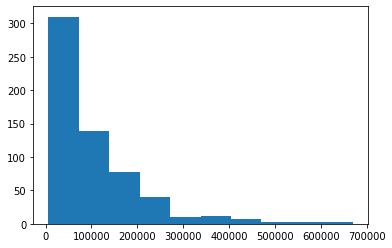

In [393]:
plt.hist(data_price['median_sale_price'])

In [416]:
Xp = sm.add_constant(data_price[['perc_green', 'perc_blue', 'perc_yellow', 'perc_red']])
smmodel_pc = sm.OLS(data_price['median_sale_price'], Xp)
smfit_pc = smmodel_pc.fit()
print(smfit_pc.summary())

                            OLS Regression Results                            
Dep. Variable:      median_sale_price   R-squared:                       0.164
Model:                            OLS   Adj. R-squared:                  0.159
Method:                 Least Squares   F-statistic:                     29.29
Date:                Sun, 15 Dec 2019   Prob (F-statistic):           2.95e-22
Time:                        15:11:18   Log-Likelihood:                -7719.5
No. Observations:                 601   AIC:                         1.545e+04
Df Residuals:                     596   BIC:                         1.547e+04
Df Model:                           4                                         
Covariance Type:            nonrobust                                         
                  coef    std err          t      P>|t|      [0.025      0.975]
-------------------------------------------------------------------------------
const        1.222e+05   8789.626     13.906      

(array([  8.,  30.,  71.,  71., 104.,  99., 109.,  71.,  24.,  14.]),
 array([ 8.7311749 ,  9.19956071,  9.66794652, 10.13633233, 10.60471814,
        11.07310395, 11.54148976, 12.00987556, 12.47826137, 12.94664718,
        13.41503299]),
 <a list of 10 Patch objects>)

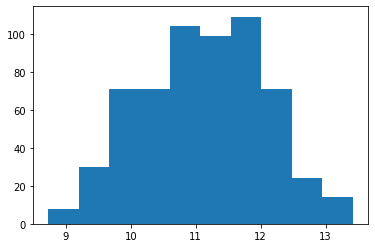

In [394]:
plt.hist(data_price['log_median_sale_price'])

In [417]:
smmodel_pcl = sm.OLS(data_price['log_median_sale_price'], Xp)
smfit_pcl = smmodel_pcl.fit()
print(smfit_pcl.summary())

                              OLS Regression Results                             
Dep. Variable:     log_median_sale_price   R-squared:                       0.226
Model:                               OLS   Adj. R-squared:                  0.221
Method:                    Least Squares   F-statistic:                     43.46
Date:                   Sun, 15 Dec 2019   Prob (F-statistic):           5.10e-32
Time:                           15:11:33   Log-Likelihood:                -738.08
No. Observations:                    601   AIC:                             1486.
Df Residuals:                        596   BIC:                             1508.
Df Model:                              4                                         
Covariance Type:               nonrobust                                         
                  coef    std err          t      P>|t|      [0.025      0.975]
-------------------------------------------------------------------------------
const          11.49